# Import and preprocess

In [1]:
import scvelo as scv
import loompy
import velocyto as vcy
import pandas as pd
import scanpy as sc
scv.logging.print_version()

Running scvelo 0.2.2 (python 3.7.6) on 2020-08-04 20:53.


In [2]:
print(loompy.__version__)

2.0.17


In [3]:
scv.settings.verbosity = 3 # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True # set max width size for presenter view
scv.set_figure_params('scvelo') # for beautified visualization

In [4]:
results_file = 'write/steadystate_scRCombined_subsamp15k.h5ad'  # the file that will store the analysis results

In [5]:
adata = scv.read_loom("data/scRNAseq_velocyto_loomFiles/scRCombined_subsamp15k_counts.loom")


In [6]:
adata

AnnData object with n_obs × n_vars = 15000 × 31053
    obs: 'Clusters', '_X', '_Y', 'clusters'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [8]:
adata.obs['clusters'] = pd.Categorical(adata.obs['clusters'])

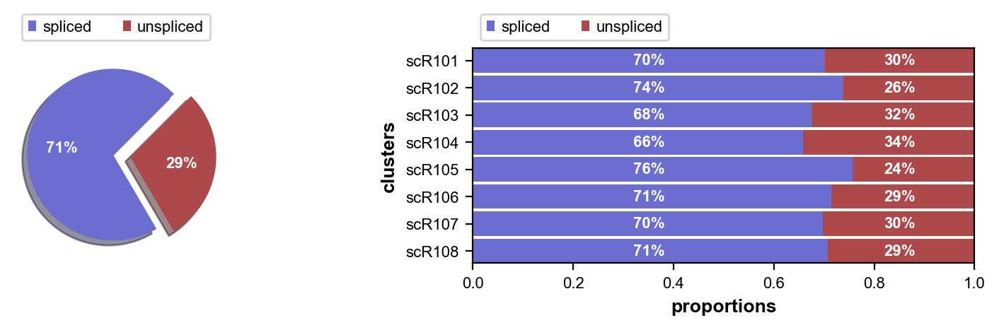

In [9]:
scv.pl.proportions(adata)

In [10]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

Filtered out 22848 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Exctracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:16) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [11]:
adata

AnnData object with n_obs × n_vars = 15000 × 2000
    obs: 'Clusters', '_X', '_Y', 'clusters', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'pca', 'neighbors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu'
    obsp: 'distances', 'connectivities'

# PCA and UMAP

In [12]:
sc.tl.pca(adata, svd_solver='arpack')

In [13]:
sc.tl.umap(adata)

In [14]:
adata

AnnData object with n_obs × n_vars = 15000 × 2000
    obs: 'Clusters', '_X', '_Y', 'clusters', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu'
    obsp: 'distances', 'connectivities'

# Clustering the neighborhood graph

In [15]:
sc.tl.leiden(adata)

... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


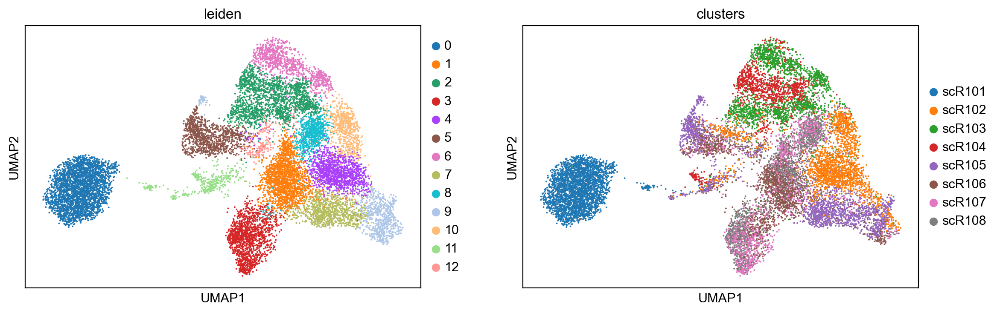

In [16]:
sc.pl.umap(adata, color=['leiden','clusters'])

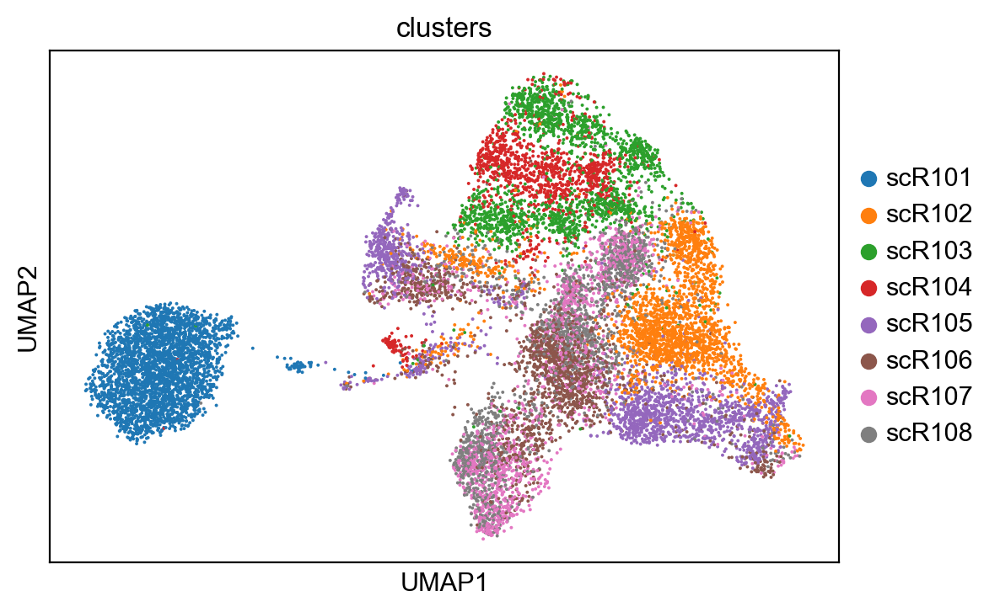

In [17]:
sc.pl.umap(adata, color='clusters')

# Finding marker genes

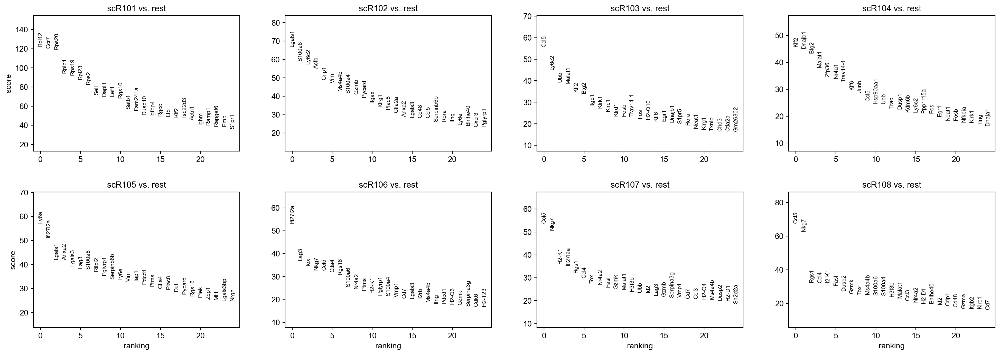

In [18]:
sc.tl.rank_genes_groups(adata, 'clusters', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

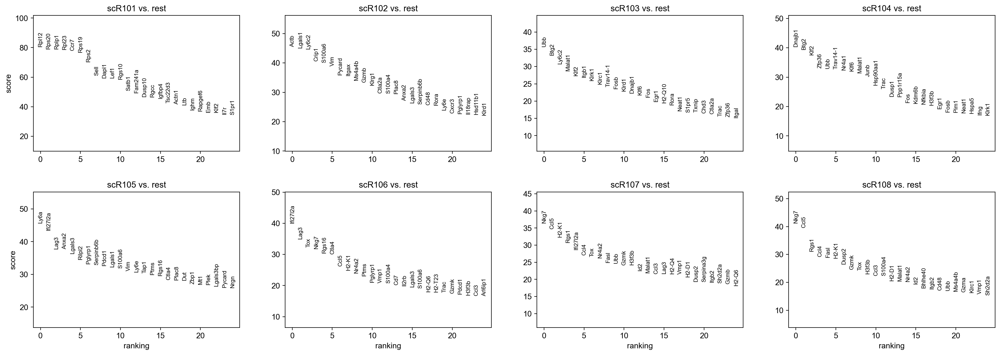

In [19]:
sc.tl.rank_genes_groups(adata, 'clusters', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [20]:
#adata.write(results_file)

In [21]:
adata

AnnData object with n_obs × n_vars = 15000 × 2000
    obs: 'Clusters', '_X', '_Y', 'clusters', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'clusters_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu'
    obsp: 'distances', 'connectivities'

In [22]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

,scR101,scR102,scR103,scR104,scR105,scR106,scR107,scR108
0,Rpl12,Actb,Ubb,Dnajb1,Ly6a,Ifi27l2a,Nkg7,Nkg7
1,Rps20,Lgals1,Btg2,Btg2,Ifi27l2a,Lag3,Ccl5,Ccl5
2,Rplp1,Ly6c2,Ly6c2,Klf2,Lag3,Tox,H2-K1,Rgs1
3,Rpl23,Crip1,Malat1,Zfp36,Anxa2,Nkg7,Rgs1,Ccl4
4,Ccr7,S100a6,Klf2,Ubb,Lgals3,Rgs16,Ifi27l2a,Fasl
5,Rps19,Vim,Itgb1,Trav14-1,Rilpl2,Ctla4,Ccl4,H2-K1
6,Rps2,Pycard,Klrk1,Nr4a1,Pglyrp1,Ccl5,Tox,Dusp2
7,Sell,Itgax,Klrc1,Klf6,Serpinb6b,H2-K1,Nr4a2,Gzmk
8,Dapl1,Ms4a4b,Trav14-1,Malat1,Pdcd1,Nr4a2,Fasl,Tox
9,Lef1,Gzmb,Fosb,Junb,Lgals1,Ptms,Ubb,H3f3b


In [23]:
marker1_2 = ["Rpl12","Actb","Ubb","Dnajb1","Ly6a","Ifi27l2a","Nkg7","Nkg7",
             "Rps20","Lgals1","Btg2","Btg2","Ifi27l2a","Lag3","Ccl5","Ccl5"]


In [24]:
marker1_2 = list(set(marker1_2))

In [25]:
marker1_2

['Rpl12',
 'Lgals1',
 'Actb',
 'Lag3',
 'Nkg7',
 'Ccl5',
 'Btg2',
 'Dnajb1',
 'Ifi27l2a',
 'Ubb',
 'Ly6a',
 'Rps20']

# RNA Velocity

In [26]:
scv.tl.velocity(adata)
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:03) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:31) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


### Velocity stream lines on UMAP

computing velocity embedding
    finished (0:00:05) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


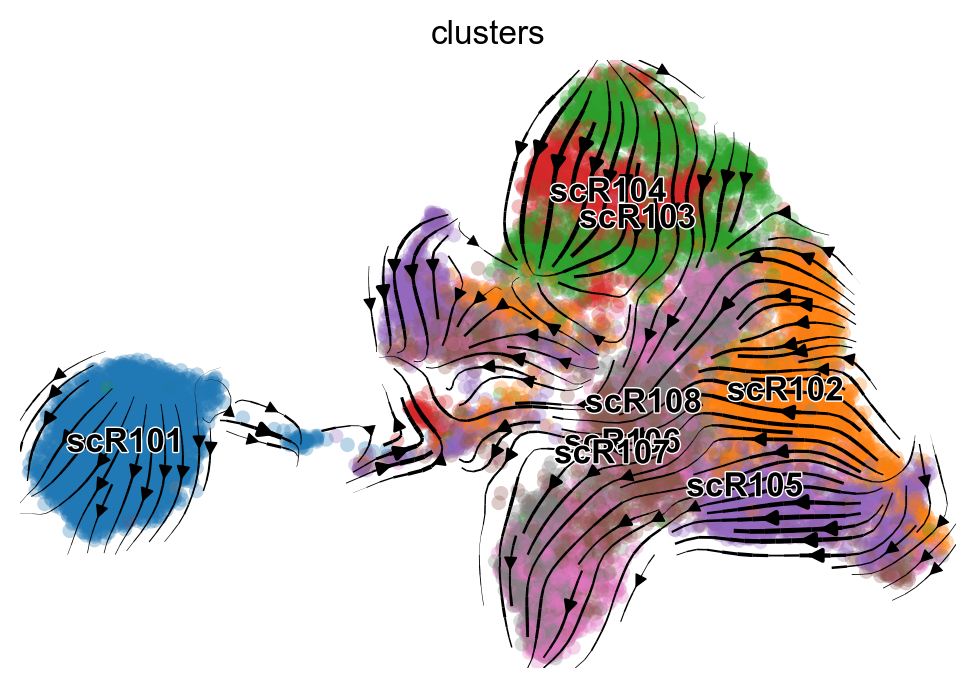

In [27]:
scv.pl.velocity_embedding_stream(adata, basis='umap')

### Phase portraits

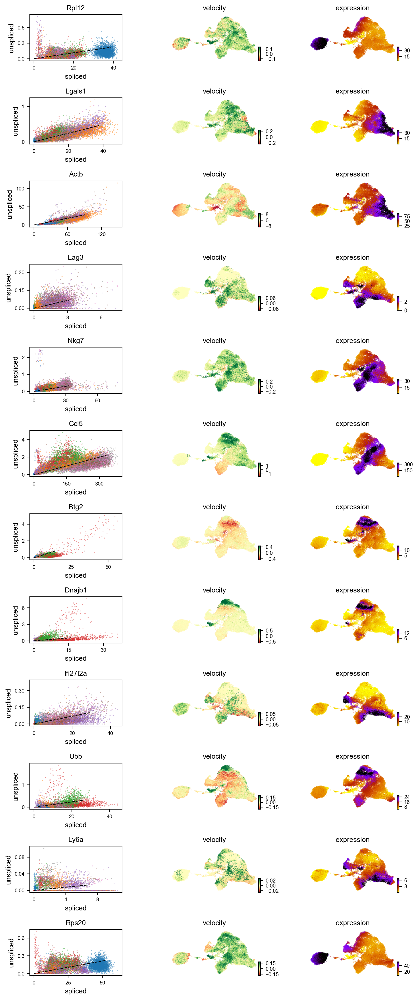

In [28]:
scv.pl.velocity(adata, marker1_2, ncols=1)

### Top-likelihood genes

In [29]:
scv.tl.rank_velocity_genes(adata, groupby='clusters', min_corr=.3)
df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:08) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,scR101,scR102,scR103,scR104,scR105,scR106,scR107,scR108
0,Foxp1,Rora,Chsy1,Kdm6b,Rora,Osbpl3,Setbp1,Ikzf3
1,St8sia1,Hk2,Il18r1,Nfkbid,Stat3,Gxylt1,Ikzf3,Setbp1
2,Il6st,Furin,Il18rap,Hsph1,Eea1,Bcl2,Entpd1,Osbpl3
3,Cmah,Armc7,Slamf7,Ppp1r15a,E2f2,Nsmaf,Gxylt1,Cdk6
4,Satb1,Il18r1,Fcgr2b,Cdkn1a,Tox,Ctla4,Cdk6,Entpd1


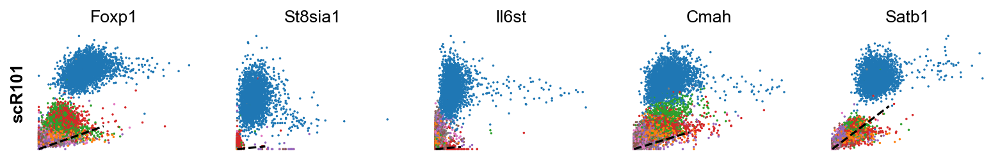

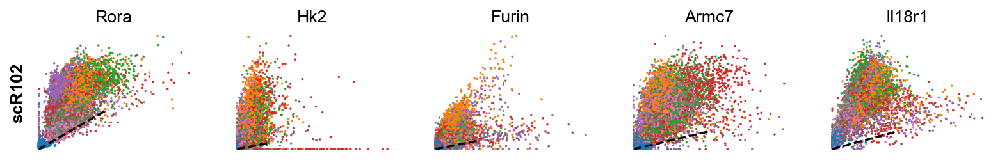

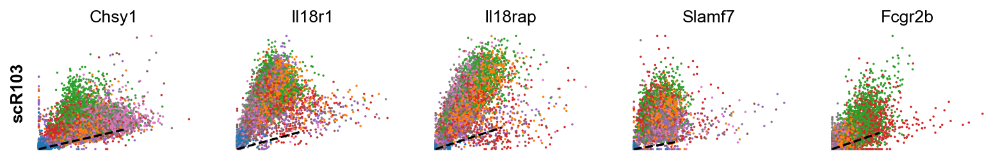

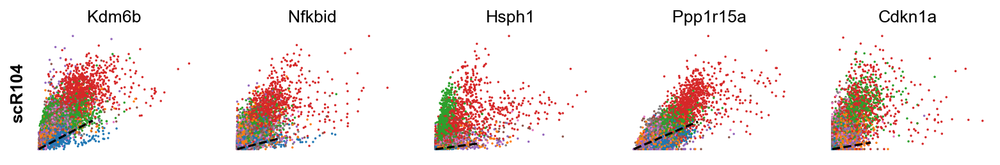

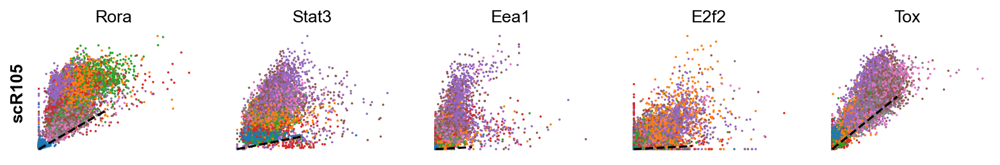

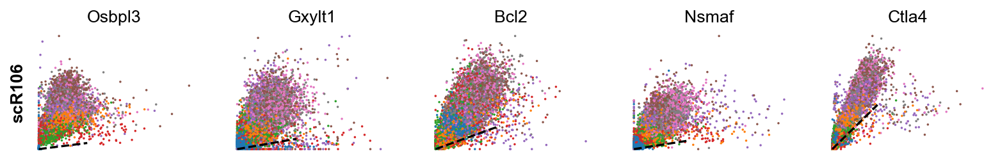

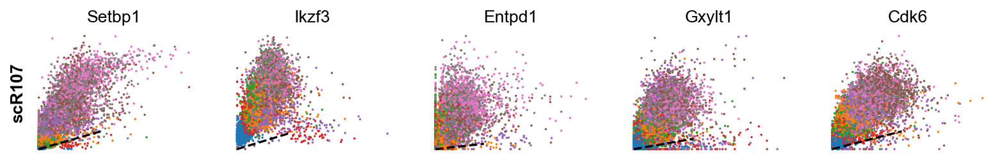

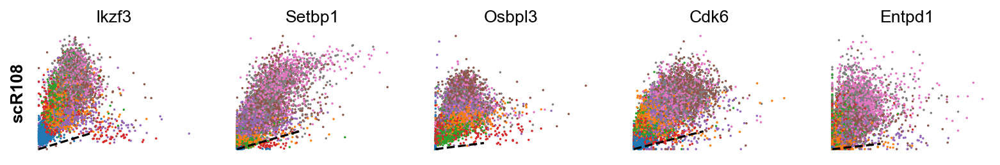

In [30]:
kwargs = dict(frameon=False, size=10, linewidth=1.5)

for cluster in ["scR101","scR102","scR103","scR104","scR105","scR106","scR107","scR108"]:
    scv.pl.scatter(adata, df[cluster][:5], ylabel=cluster, **kwargs)
    

### Speed and coherence

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


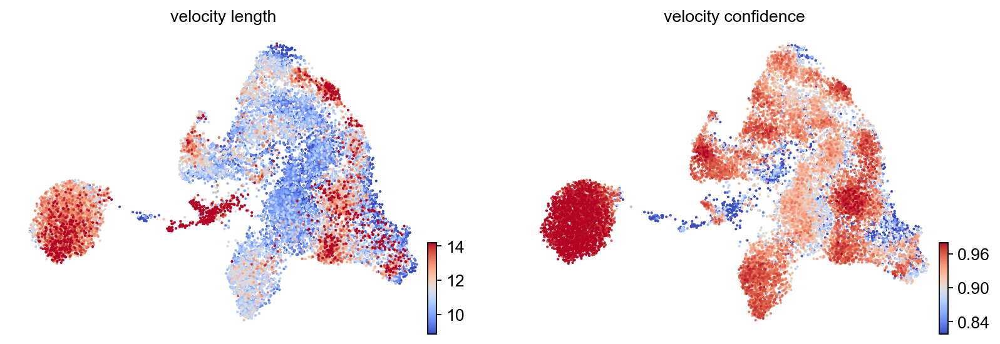

In [31]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

In [32]:
df = adata.obs.groupby('clusters')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)


clusters,scR101,scR102,scR103,scR104,scR105,scR106,scR107,scR108
velocity_length,12.493117,11.269711,10.967752,11.158673,12.350794,10.750889,10.312182,10.128021
velocity_confidence,0.966826,0.919822,0.927167,0.907523,0.915287,0.902325,0.914581,0.906315


### velocity-inferred transitions

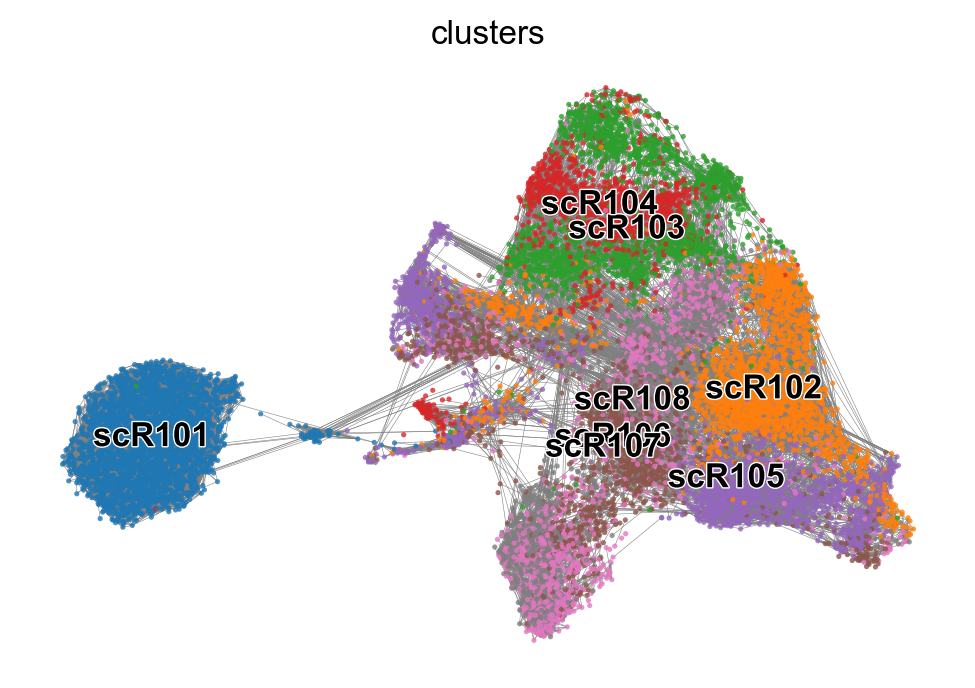

In [33]:
scv.pl.velocity_graph(adata, threshold=.1)

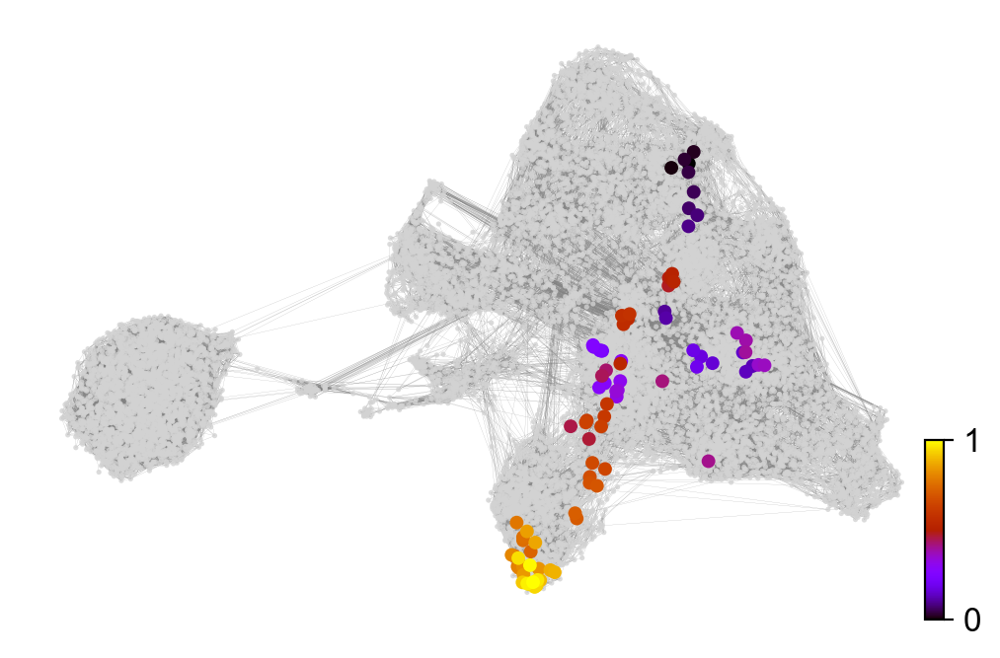

In [36]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=10)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=100, c='ascending', cmap='gnuplot', ax=ax)


### Velocity pseudotime

computing terminal states
    identified 5 regions of root cells and 2 regions of end points .
    finished (0:00:02) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


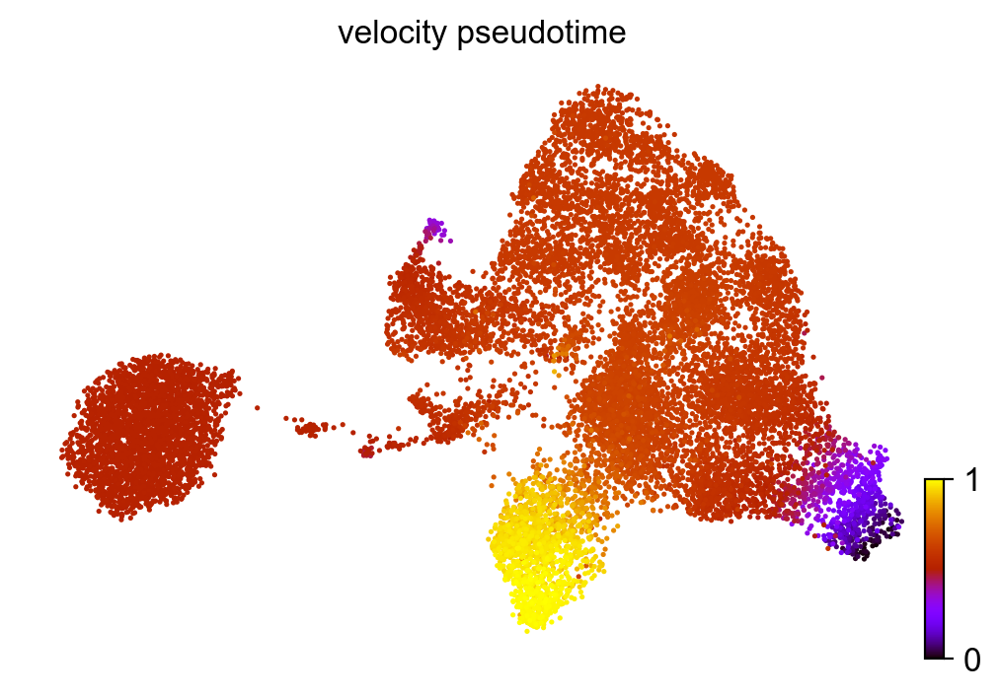

In [37]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')


### PAGA velocity graph

In [38]:
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']

scv.tl.paga(adata, groups='clusters')
df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:08) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,scR101,scR102,scR103,scR104,scR105,scR106,scR107,scR108
scR101,0,0,0,0,0,0,0,0
scR102,0,0,0,0,0,0,0,0.18
scR103,0,0,0,0,0,0,0,0
scR104,0,0,0.79,0,0,0,0,0
scR105,0,0.055,0,0.021,0,0.28,0,0
scR106,0,0,0,0,0,0,0.29,0
scR107,0,0,0,0,0,0,0,0
scR108,0,0,0,0,0,0,0,0


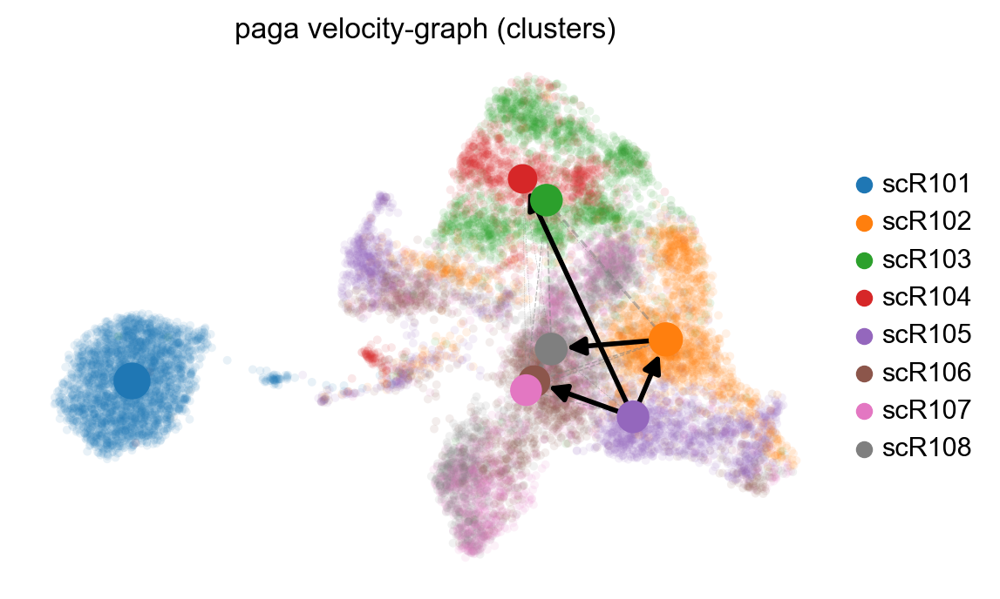

In [39]:
scv.pl.paga(adata, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1)

In [40]:
adata.write(results_file)